<a href="https://colab.research.google.com/github/markpairdha/Fake_News_Detection/blob/main/FakeNewsDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fake and Real News Detection using LSTM and Deep Learning

* Analysis
* Data Cleaning

In [1]:
#https://www.kaggle.com/clmentbisaillon/fake-and-real-news-dataset

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk 
import re #regular expression regrix 
from wordcloud import WordCloud #text visualization package,total no of words & how words are distributed in the text data. 

In [3]:
from tensorflow.keras.preprocessing.text import Tokenizer
#tokenize text data
from tensorflow.keras.preprocessing.sequence import pad_sequences
#for fixed length seq|| of inputs
from tensorflow.keras.models import Sequential
#fitting model layers
from tensorflow.keras.layers import Dense,Embedding,LSTM,Conv1D,MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,accuracy_score

# Exploring Fake News

In [4]:
fake = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv')
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [5]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [6]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

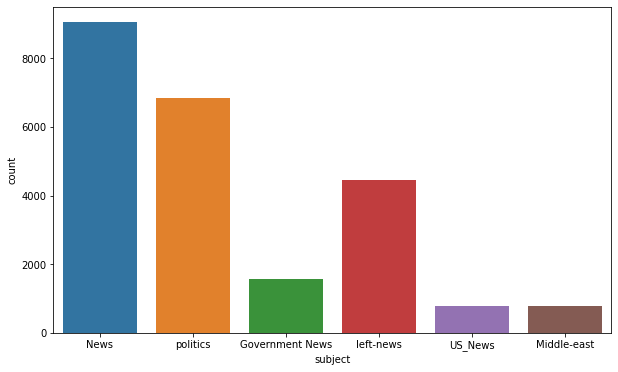

In [7]:
plt.figure(figsize=(10,6))
sns.countplot(x='subject',data=fake)

WordCloud for text data visualization

In [8]:
#fake['text'].tolist()

In [9]:
text = ''.join(fake['text'].tolist())
text
#''.join(['mark','sathish','pairdha'])

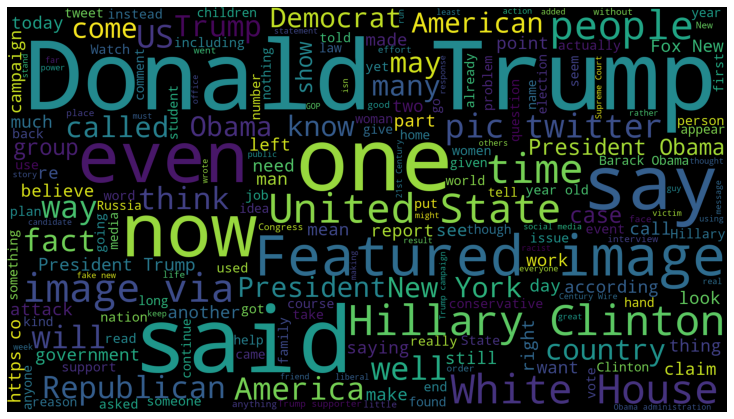

In [10]:
wordcloud = WordCloud(width=1920,height=1080).generate(text)
fig = plt.figure(figsize=(10,6))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

# Exploring Real News

In [11]:
real = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')

In [18]:
real.sample(5)

,title,text,subject,date
16103,"France, keen to avoid student anger, plans 1-b...",PARIS (Reuters) - France announced a one-billi...,worldnews,"October 30, 2017"
14428,EU's Tusk says alarmed that Poland's policy re...,WARSAW (Reuters) - European Council President ...,worldnews,"November 19, 2017"
14913,"Erdogan swipes at Russia, U.S. missions in Syria",ANKARA/SOCHI (Reuters) - Turkish President Tay...,worldnews,"November 13, 2017"
6417,Trump secretary of state choice to say Russia ...,WASHINGTON (Reuters) - U.S. President-elect Do...,politicsNews,"January 11, 2017"
16735,Germany approves sale of three Thyssenkrupp su...,BERLIN (Reuters) - The German government has a...,worldnews,"October 23, 2017"


In [12]:
text = ''.join(real['text'].tolist())

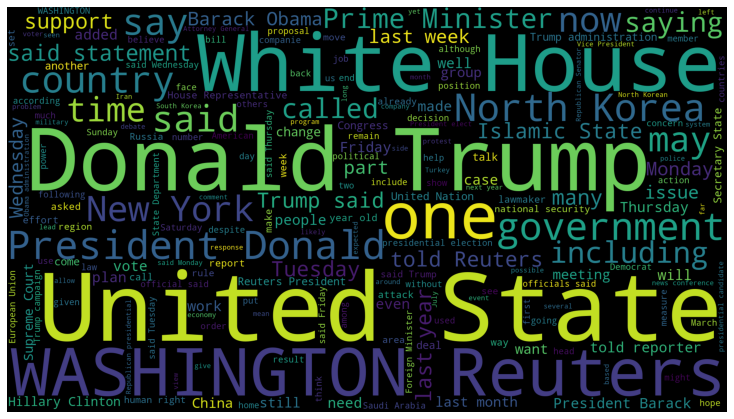

In [13]:
wordcloud = WordCloud(width=1920,height=1080).generate(text)
fig = plt.figure(figsize=(10,6))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Difference between two datasets(Fake vs Real)
* Most of the text contains **Reuters(publisher)** info 
* Some text are tweets from Twitter
* Few text do not contain any publisher info

# Cleaning the data
* Removing reuters or twitter tweet info from the text 
* Text can be splitted only once at  '-' which is always present after mentoining source of reuters,thus seperating text data from reuters data.
* If we dont get text part then reuters info wasnt given for that record.
* the twitter tweets always have same source,a log text of max 259 characters
* thereby marking those having < 120 length tweet will be contentless.

In [14]:
real.sample(5)

,title,text,subject,date
15906,Russia's Putin says situation in Syria develop...,TEHRAN (Reuters) - Russian President Vladimir ...,worldnews,"November 1, 2017"
4117,Schumer says U.S. budget deal doable if Trump ...,WASHINGTON (Reuters) - Senate Democratic Leade...,politicsNews,"April 23, 2017"
5376,Top Senate Republican: Will move on healthcare...,WASHINGTON (Reuters) - U.S. Senate Leader McCo...,politicsNews,"February 17, 2017"
12464,"EU pushes to curb Africa migration more, still...",BRUSSELS (Reuters) - European Union leaders wi...,worldnews,"December 12, 2017"
15195,Peru's Congress passes law to target Odebrecht...,LIMA (Reuters) - Peru s opposition-ruled Congr...,worldnews,"November 10, 2017"


In [15]:
unknown_publishers = []
# real.text.values is in array format,
for index,row in enumerate(real.text.values):
  try :
    record = row.split('-',maxsplit=1)
    record[1]
    assert(len(record[0])<120)

  except :
    unknown_publishers.append(index)  

In [16]:
len(unknown_publishers)

222

In [17]:
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [19]:
publisher =[]
tmp_text =[]
for index,row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append('Unknown')
  else :
    #print(index)
    #print(row)
    record = row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())  

In [20]:
real['publisher']=publisher
real['text']=tmp_text

In [21]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [22]:
empty_fake_index = [index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [23]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [24]:
real['text']=real['title']+" "+real['text']
fake['text']=fake['title']+" "+fake['text']

In [25]:
#A-Z => a-z
real['text'] = real['text'].apply(lambda x : str(x).lower())
fake['text'] = fake['text'].apply(lambda x : str(x).lower())

# Preprocessing text

In [26]:
real['class']=1
fake['class']=0

In [27]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [28]:
real = real[['text','class']]
fake = fake[['text','class']]

In [29]:
data = real.append(fake,ignore_index=True)
data

,text,class
0,"as u.s. budget fight looms, republicans flip t...",1
1,u.s. military to accept transgender recruits o...,1
2,senior u.s. republican senator: 'let mr. muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge 'much mor...,1
...,...,...
44893,mcpain: john mccain furious that iran treated ...,0
44894,justice? yahoo settles e-mail privacy class-ac...,0
44895,sunnistan: us and allied ‘safe zone’ plan to t...,0
44896,how to blow $700 million: al jazeera america f...,0


In [30]:
def remove_special_chars(x):
	x = re.sub(r'[^\w ]+', "", x)
	x = ' '.join(x.split())
	return x

#remove_special_chars('this is @awesome ###')


In [32]:
data['text'].apply(lambda x : remove_special_chars(x))
data.head()

,text,class
0,"as u.s. budget fight looms, republicans flip t...",1
1,u.s. military to accept transgender recruits o...,1
2,senior u.s. republican senator: 'let mr. muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge 'much mor...,1


## Vectorization- Word2vec

###### word2vec is a word embeddings technique
###### has the power to capture context of word m,semantic and synactic similarity,relation with other words,

In [33]:
import gensim
y=data['class'].values
y

array([1, 1, 1, ..., 0, 0, 0])

In [34]:
X=[d.split() for d in data['text'].tolist()]
X

[['as',
  'u.s.',
  'budget',
  'fight',
  'looms,',
  'republicans',
  'flip',
  'their',
  'fiscal',
  'script',
  'the',
  'head',
  'of',
  'a',
  'conservative',
  'republican',
  'faction',
  'in',
  'the',
  'u.s.',
  'congress,',
  'who',
  'voted',
  'this',
  'month',
  'for',
  'a',
  'huge',
  'expansion',
  'of',
  'the',
  'national',
  'debt',
  'to',
  'pay',
  'for',
  'tax',
  'cuts,',
  'called',
  'himself',
  'a',
  '“fiscal',
  'conservative”',
  'on',
  'sunday',
  'and',
  'urged',
  'budget',
  'restraint',
  'in',
  '2018.',
  'in',
  'keeping',
  'with',
  'a',
  'sharp',
  'pivot',
  'under',
  'way',
  'among',
  'republicans,',
  'u.s.',
  'representative',
  'mark',
  'meadows,',
  'speaking',
  'on',
  'cbs’',
  '“face',
  'the',
  'nation,”',
  'drew',
  'a',
  'hard',
  'line',
  'on',
  'federal',
  'spending,',
  'which',
  'lawmakers',
  'are',
  'bracing',
  'to',
  'do',
  'battle',
  'over',
  'in',
  'january.',
  'when',
  'they',
  'return',
 

In [35]:
type(X[0])

list

In [36]:
print(X[0])

['as', 'u.s.', 'budget', 'fight', 'looms,', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'u.s.', 'congress,', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts,', 'called', 'himself', 'a', '“fiscal', 'conservative”', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018.', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans,', 'u.s.', 'representative', 'mark', 'meadows,', 'speaking', 'on', 'cbs’', '“face', 'the', 'nation,”', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending,', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january.', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday,', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to

In [37]:
DIM = 100
#dimension,each word will be converted into a sequence of 100 vectors
w2v_model = gensim.models.Word2Vec(sentences=X,size=DIM,window=10,min_count=1)

In [38]:
len(w2v_model.wv.vocab)

375437

In [39]:
w2v_model.wv.vocab

{'as': <gensim.models.keyedvectors.Vocab at 0x7f6499242990>,
 'u.s.': <gensim.models.keyedvectors.Vocab at 0x7f6499208310>,
 'budget': <gensim.models.keyedvectors.Vocab at 0x7f6499208950>,
 'fight': <gensim.models.keyedvectors.Vocab at 0x7f64992083d0>,
 'looms,': <gensim.models.keyedvectors.Vocab at 0x7f6499208610>,
 'republicans': <gensim.models.keyedvectors.Vocab at 0x7f6499208450>,
 'flip': <gensim.models.keyedvectors.Vocab at 0x7f6499208a10>,
 'their': <gensim.models.keyedvectors.Vocab at 0x7f6499208910>,
 'fiscal': <gensim.models.keyedvectors.Vocab at 0x7f6499208690>,
 'script': <gensim.models.keyedvectors.Vocab at 0x7f6499208590>,
 'the': <gensim.models.keyedvectors.Vocab at 0x7f6499208ad0>,
 'head': <gensim.models.keyedvectors.Vocab at 0x7f6499208c50>,
 'of': <gensim.models.keyedvectors.Vocab at 0x7f6499208cd0>,
 'a': <gensim.models.keyedvectors.Vocab at 0x7f6499208410>,
 'conservative': <gensim.models.keyedvectors.Vocab at 0x7f6499208850>,
 'republican': <gensim.models.keyedvec

In [40]:
w2v_model.wv['india']

array([-2.3342040e-01,  4.7347924e-01, -7.7986830e-01, -2.1895375e+00,
       -1.5830942e+00, -7.5434697e-01, -2.1932545e+00, -2.0616190e+00,
       -7.8255177e-01, -1.6785182e+00,  1.1771923e+00,  1.6468760e+00,
        6.4869754e-02, -1.9126360e-01,  1.2938411e+00, -1.5445443e+00,
        9.4151431e-01,  6.6373694e-01, -1.5888876e+00,  3.8275661e+00,
       -4.6223018e-01, -1.5821446e+00,  1.2635970e+00,  1.3190604e+00,
        1.5620111e+00, -2.0368583e+00, -7.5706631e-01,  1.6096849e+00,
       -6.8920098e-02,  1.3818487e-02,  1.3138126e+00, -6.7648655e-01,
       -1.1156163e+00,  5.3981602e-01, -2.0120587e+00,  1.8596494e+00,
        1.5473391e-01, -1.4519739e-01,  1.1306583e+00, -1.1435064e+00,
        8.2417679e-01,  5.8512855e-01, -1.9631965e+00,  1.0060648e-01,
       -3.7914553e-01, -1.3163505e+00, -2.3097710e-01,  2.2285628e+00,
        9.3349874e-01,  4.9146497e-01, -5.1556450e-01, -4.7029516e-01,
        1.4529560e+00, -5.1980144e-01,  2.3762002e+00,  4.9033442e-01,
      

In [41]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.7550046443939209),
 ('malaysia', 0.7057240009307861),
 ('pakistan,', 0.6972131729125977),
 ('china,', 0.6833261847496033),
 ('india,', 0.6752192974090576),
 ('china', 0.6729140281677246),
 ('beijing', 0.6555320620536804),
 ('asia,', 0.6372677683830261),
 ('indian', 0.6333187818527222),
 ('china’s', 0.6274062395095825)]

In [42]:
w2v_model.wv.most_similar('modi')

[('narendra', 0.761345386505127),
 ('najib', 0.6156260967254639),
 ('abe,', 0.599815309047699),
 ('inada,', 0.5996752381324768),
 ("india's", 0.5980347394943237),
 ('u.s.-india', 0.590070366859436),
 ('abe', 0.5844094753265381),
 ('tokyo', 0.5821791291236877),
 ('india', 0.5692867636680603),
 ('zelvia', 0.5521160960197449)]

In [43]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [44]:
X = tokenizer.texts_to_sequences(X)

In [45]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'he': 12,
 'with': 13,
 'was': 14,
 'it': 15,
 'trump': 16,
 'as': 17,
 'his': 18,
 'by': 19,
 'said': 20,
 'has': 21,
 'be': 22,
 'have': 23,
 'from': 24,
 'not': 25,
 'at': 26,
 'are': 27,
 'this': 28,
 'who': 29,
 'an': 30,
 'they': 31,
 'but': 32,
 'would': 33,
 'we': 34,
 'i': 35,
 'about': 36,
 'u.s.': 37,
 'will': 38,
 'their': 39,
 'president': 40,
 'had': 41,
 'been': 42,
 'you': 43,
 't': 44,
 'were': 45,
 'or': 46,
 'after': 47,
 'which': 48,
 'more': 49,
 'she': 50,
 'people': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'what': 55,
 'when': 56,
 'new': 57,
 'out': 58,
 'all': 59,
 'its': 60,
 'also': 61,
 'over': 62,
 'donald': 63,
 'state': 64,
 'no': 65,
 'up': 66,
 'our': 67,
 'there': 68,
 'can': 69,
 'said.': 70,
 'just': 71,
 'than': 72,
 'house': 73,
 'other': 74,
 'some': 75,
 'could': 76,
 'republican': 77,
 'obama': 78,
 'into': 79,
 'told': 80,
 'united

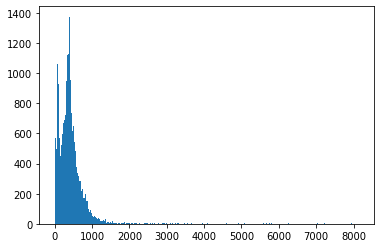

In [46]:
plt.hist([len(x) for x in X],bins=700)
plt.show()

In [47]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])


1606

In [48]:
maxlen = 1000
X = pad_sequences(X,maxlen=maxlen)

In [49]:
len(X[0])

1000

In [50]:
vocab_size = len(tokenizer.word_index)+1
vocab = tokenizer.word_index

In [51]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size,DIM))

  for word,i in vocab.items():
    weight_matrix[i] = model.wv[word]

  return weight_matrix  

In [52]:
embedding_vectors = get_weight_matrix(w2v_model)
embedding_vectors.shape

(375438, 100)

In [53]:
model = Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [54]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 1000, 100)         37543800  
_________________________________________________________________
lstm (LSTM)                  (None, 128)               117248    
_________________________________________________________________
dense (Dense)                (None, 1)                 129       
Total params: 37,661,177
Trainable params: 117,377
Non-trainable params: 37,543,800
_________________________________________________________________


In [55]:
X_train,X_test,y_train,y_test = train_test_split(X,y)

In [56]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 [==============================] - 53s 60ms/step - loss: 0.1277 - acc: 0.9556 - val_loss: 0.0725 - val_acc: 0.9785
Epoch 2/6
737/737 [==============================] - 42s 57ms/step - loss: 0.0797 - acc: 0.9745 - val_loss: 0.1760 - val_acc: 0.9152
Epoch 3/6
737/737 [==============================] - 43s 58ms/step - loss: 0.0516 - acc: 0.9830 - val_loss: 0.0382 - val_acc: 0.9892
Epoch 4/6
737/737 [==============================] - 42s 57ms/step - loss: 0.0205 - acc: 0.9936 - val_loss: 0.0306 - val_acc: 0.9909
Epoch 5/6
737/737 [==============================] - 43s 58ms/step - loss: 0.0164 - acc: 0.9954 - val_loss: 0.0282 - val_acc: 0.9929
Epoch 6/6
737/737 [==============================] - 43s 59ms/step - loss: 0.0209 - acc: 0.9931 - val_loss: 0.0274 - val_acc: 0.9900


In [57]:
y_pred = (model.predict(X_test)>=0.5).astype(int)

In [58]:
accuracy_score(y_test,y_pred)

0.9927839643652562

In [59]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5741
           1       0.99      0.99      0.99      5484

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [60]:
x=['this is a news']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=1000)
(model.predict(x)>=0.5).astype(int)

array([[0]])

In [61]:
x=['India reports 38,949 cases, 542 deaths in last 24 hours. Recovery rate has increased to 97.28% while active cases now constitute 1.39% of total cases']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=1000)
(model.predict(x)>=0.5).astype(int)  

array([[1]])